In [1]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
from astropy.modeling import models, fitting
from photutils.aperture import CircularAperture
from photutils.aperture import aperture_photometry

%matplotlib inline
#%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')
plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot, cmap='gnuplot2'):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=(0, np.quantile(file, [0.99])), cmap=cmap, origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

$m_\text{true} = \text{ZP} + m_\text{instrument}$

$-2.5 \log_{10} f_\lambda = \text{ZP} - 2.5 \log_{10} R[e^-/s] \:\:\: \Longrightarrow \:\:\: f_\lambda [erg/s/cm^2/\AA] = 10^{-0.4 \text{ZP}} R[e^-/s]$ 

# 1) Aperture Photometry

## Filter Ha

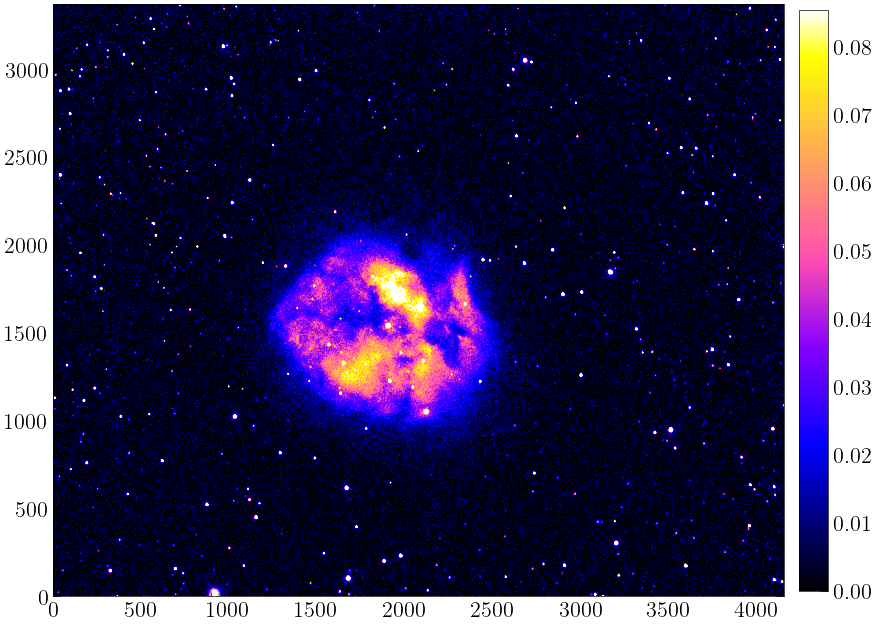

In [3]:
final_Ha = Open_Fits(filepath='Data/final_Ha.fits', plot=True)

In [4]:
final_Ha_radec = fits.open('Data/final_Ha_radec.fits')[1].data
final_Ha_radec

FITS_rec([(328.6532846 , 47.15560772,  921.82434 , 1.74548531e+01, 3.45572052e+01, 0.00260925),
          (328.37017436, 47.26660542, 1907.9147  , 1.53818115e+03, 9.16756153e+00, 0.04750919),
          (328.12018925, 47.38700367, 2686.7764  , 3.04577710e+03, 7.69480991e+00, 0.0024128 ),
          (328.37558545, 47.2012023 , 2125.0745  , 1.04945142e+03, 6.86020613e+00, 0.02323532),
          (328.1420862 , 47.22878445, 3172.8506  , 1.84244763e+03, 6.70983076e+00, 0.00212526),
          (328.16143343, 47.1119084 , 3515.8984  , 9.45524536e+02, 4.97167635e+00, 0.0022378 ),
          (328.39010883, 47.49197238,  970.0183  , 3.12536255e+03, 3.22498703e+00, 0.00243759),
          (328.33571165, 47.44714909, 1404.0621  , 2.93674268e+03, 1.34269893e+00, 0.0023849 ),
          (328.52438474, 47.12269255, 1681.8555  , 1.02863037e+02, 5.45206022e+00, 0.00224209),
          (328.55278954, 47.25886365, 1036.0205  , 1.02124268e+03, 3.96849036e+00, 0.00243831),
          (328.26415876, 47.05925134, 32

In [5]:
print(np.min(final_Ha_radec['ra']), np.max(final_Ha_radec['ra']))
print(np.min(final_Ha_radec['dec']), np.max(final_Ha_radec['dec']))

327.861475729151 328.7958090865958
46.9823001142356 47.5606852155633


In [6]:
GAIA_catalogue = fits.open('Data/GAIA_catalogue_12_145.fit')[1].data
GAIA_catalogue

FITS_rec([(327.86075051624, 47.05895103899, 1974724330898100096, 0.0101, 0.011, 0.4961, 0.0125, 7.281, -4.412, 0.013, -5.792, 0.015, 1.127, 103393.97627, 12.93, 13.151129, 54114.0, 27.568, 13.505274, 70943.0, 21.738, 12.620627, 0.884646, -33.23, 3.52, 0.0, 12.375963, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 6856.1, 3.6398, -0.2169, 1558.9365, 0.9028, 0, 164473278607731403, 1237671939822257612, 0, '', 'URAT1-686501009', 'J215126.58+470332.2', 12648405, 'N2UQ000936', '', '21512658+4703323'),
          (327.86199450915, 47.18136664552, 1974729003822615552, 0.0128, 0.0129, 1.0409, 0.015, 4.848, -3.114, 0.017, -3.716, 0.016, 1.033, 34866.25155, 4.9768, 14.331354, 15744.0, 20.307, 14.845741, 27569.0, 35.801, 13.646839, 1.198902, -32.09, 7.3, 0.0, 13.31239, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 5240.1, 4.2123, 0.0144, 851.5303, 0.5493, 0, 164613278619868314, 1237672026242023511, 0, '', 'URAT1-686501015', 'J215126.86+471053.0', 12648550, 'N2UQ005080', '', '21512688+4710530'),
          (327.86274912969, 47

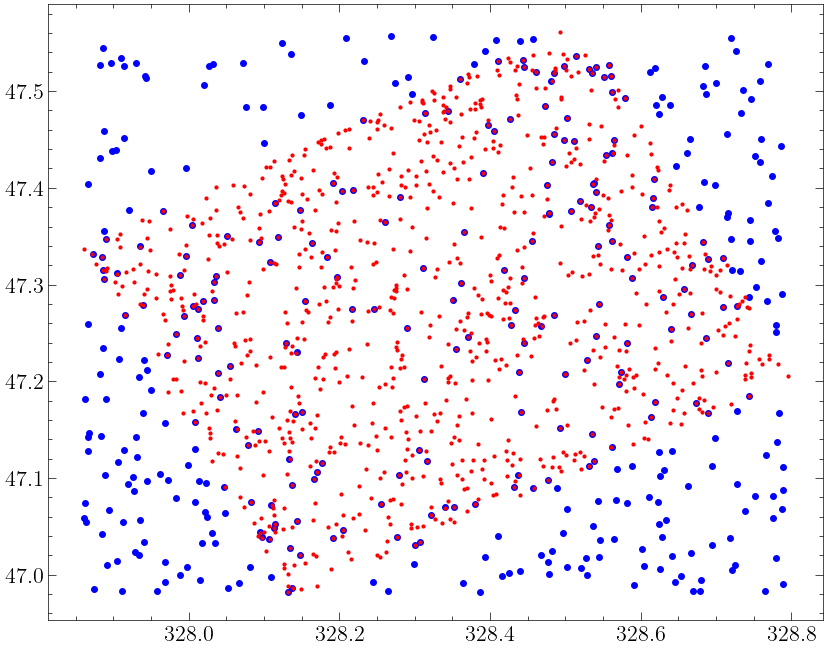

In [7]:
for i in range(len(GAIA_catalogue['RA_ICRS'])):
    plt.plot(GAIA_catalogue['RA_ICRS'][i], GAIA_catalogue['DE_ICRS'][i], c='blue', marker='o', markersize=4)

for i in range(len(final_Ha_radec['ra'])):
    plt.plot(final_Ha_radec['ra'][i], final_Ha_radec['dec'][i], c='red', marker='o', markersize=2)

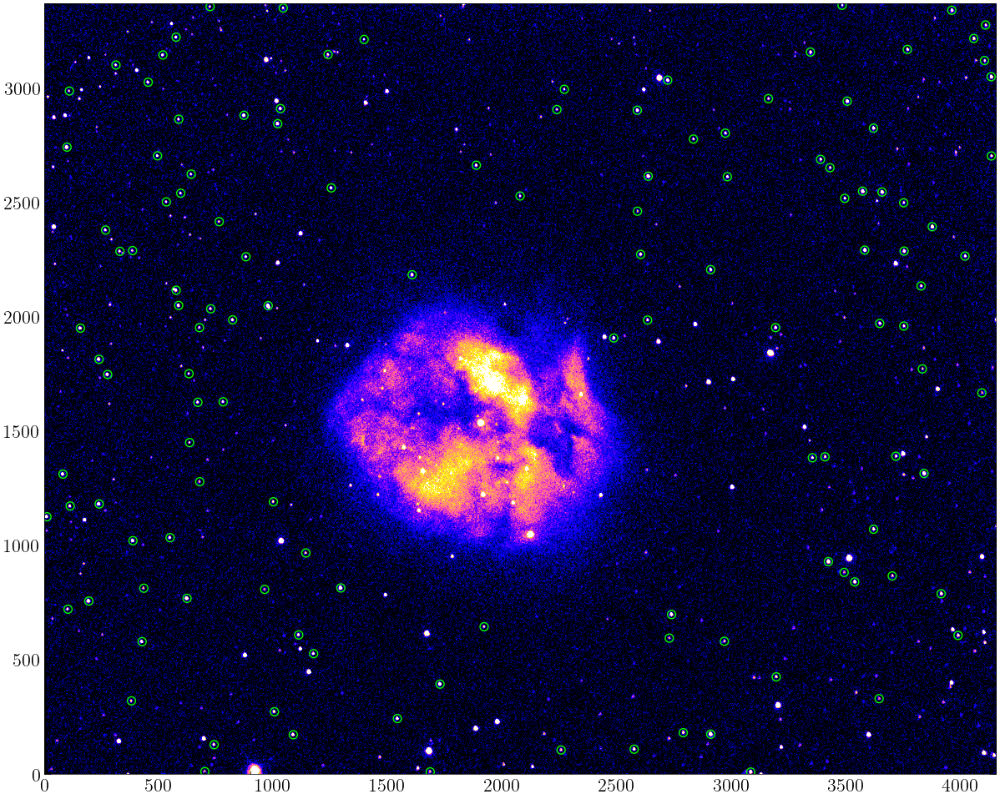

In [8]:
stars_x = []
stars_y = []
stars_mag = []
stars_Gaianame = []
stars_ra = []   # useless in this code, but can be used to identify the star at https://skyserver.GAIA.org/dr18/VisualTools/navi/
stars_dec = []  # ...

for i in range(len(GAIA_catalogue['RA_ICRS'])):
    if not ((328.25<GAIA_catalogue['RA_ICRS'][i]<328.5) and (47.2<GAIA_catalogue['DE_ICRS'][i]<47.35)):
        # Find the matches between GAIA stars and our stars
        mask_ra = np.isclose(final_Ha_radec['ra'], GAIA_catalogue['RA_ICRS'][i], atol=0, rtol=0.0000015)
        mask_dec = np.isclose(final_Ha_radec['dec'], GAIA_catalogue['DE_ICRS'][i], atol=0, rtol=0.0000015)
        mask_tot = np.logical_and(mask_ra, mask_dec)

        # If there is only one match, append the coordinates (from astrometry.net) and magnitudes (from GAIA catalogue)
        # If there is no match or more than one match, do nothing
        if np.sum(mask_tot) == 1:
            # extra masks to reduce the change of having a second star partially overlapping the first one
            mask_ra = np.isclose(final_Ha_radec['ra'], GAIA_catalogue['RA_ICRS'][i], atol=0, rtol=0.000003)
            mask_dec = np.isclose(final_Ha_radec['dec'], GAIA_catalogue['DE_ICRS'][i], atol=0, rtol=0.000003)
            mask_tot = np.logical_and(mask_ra, mask_dec)

            if np.sum(mask_tot) == 1:
                stars_x.append(final_Ha_radec['x'][mask_tot][0])
                stars_y.append(final_Ha_radec['y'][mask_tot][0])
                stars_mag.append(GAIA_catalogue['Gmag'][i])
                stars_Gaianame.append(GAIA_catalogue['Source'][i])
                stars_ra.append(GAIA_catalogue['RA_ICRS'][i])
                stars_dec.append(GAIA_catalogue['DE_ICRS'][i])
        
stars_x = np.array(stars_x)
stars_y = np.array(stars_y)
stars_mag = np.array(stars_mag)
stars_Gaianame = np.array(stars_Gaianame)
stars_ra = np.array(stars_ra)
stars_dec = np.array(stars_dec)
        
plt.figure(figsize=(18,12))
plt.imshow(final_Ha, clim=(0, np.quantile(final_Ha, [0.99])), cmap='gnuplot2', origin='lower')

for i in range(len(stars_x)):
    plt.scatter(stars_x[i], stars_y[i], facecolors='none', edgecolors='lime', s=50)

In [9]:
# Sort the star arrays by source_Id
sort_indices = np.argsort(stars_Gaianame)
stars_x = stars_x[sort_indices]
stars_y = stars_y[sort_indices]
stars_mag = stars_mag[sort_indices]
stars_Gaianame = stars_Gaianame[sort_indices]
stars_ra = stars_ra[sort_indices]
stars_dec = stars_dec[sort_indices]

In [10]:
ra_discard = [328.30728268567, 328.53136583683, 328.68915479341, 328.70924837516]
index_discard = []
for val in ra_discard:
    index_discard.append(np.where(stars_ra==val)[0][0])
    
stars_x = np.delete(stars_x, index_discard)
stars_y = np.delete(stars_y, index_discard)
stars_mag = np.delete(stars_mag, index_discard)
stars_Gaianame = np.delete(stars_Gaianame, index_discard)
stars_ra = np.delete(stars_ra, index_discard)
stars_dec = np.delete(stars_dec, index_discard)

In [11]:
def Aperture_Photometry(image, stars_x, stars_y, stars_ra, stars_dec, stars_mag, rectangle_side=40, fwhm_factor=3):
    ourfluxes = []

    fig, ax = plt.subplots(figsize=(18,12))
    ax.imshow(image, clim=(0, np.quantile(image, [0.99])), cmap='gnuplot2', origin='lower')

    for i in range(len(stars_x)):
        cutout = image[round(stars_y[i]-rectangle_side/2):round(stars_y[i]+rectangle_side/2), round(stars_x[i]-rectangle_side/2):round(stars_x[i]+rectangle_side/2)]

        # 1) Compute the FWHM of the stars to decide the radius of the circular aperture
        # x projection
        x_projection = np.mean(cutout, axis=0)
        x_fit = np.arange(len(x_projection))
        gaussian = models.Gaussian1D(amplitude=np.max(x_projection), mean=len(x_projection)/2, stddev=len(x_projection)/5)
        fit_gaussian = fitting.LevMarLSQFitter()
        fitted_gaussian = fit_gaussian(gaussian, x_fit, x_projection)
        mean_x = fitted_gaussian.mean[0]
        fwhm_x = 2.355*fitted_gaussian.stddev
        
        #fig_temp, axes_temp = plt.subplots(1, 3, figsize=(16,3.5))
        #ax_temp = axes_temp[0]
        #ax_temp.plot(x_projection, label='Data')
        #ax_temp.plot(x_fit, fitted_gaussian(x_fit), label='Fit')
        #ax_temp.axhline(0, c='black', linestyle='--', alpha=0.5, zorder=0)
        #ax_temp.axvline(mean_x, c='black', linestyle='--', alpha=0.7)
        #ax_temp.set_xlabel('y') # In the image, the x-axis of the numpy array becomes the vertical axis!
        
        
        # y projection
        y_projection = np.mean(cutout, axis=1)
        y_fit = np.arange(len(y_projection))
        gaussian = models.Gaussian1D(amplitude=np.max(y_projection), mean=len(y_projection)/2, stddev=len(y_projection)/10)
        fit_gaussian = fitting.LevMarLSQFitter()
        fitted_gaussian = fit_gaussian(gaussian, y_fit, y_projection)
        mean_y = fitted_gaussian.mean[0]
        fwhm_y = 2.355*fitted_gaussian.stddev
        
        #ax_temp = axes_temp[1]
        #ax_temp.plot(y_projection, label='Data')
        #ax_temp.plot(y_fit, fitted_gaussian(y_fit), label='Fit')
        #ax_temp.axhline(0, c='black', linestyle='--', alpha=0.5, zorder=0)
        #ax_temp.axvline(mean_y, c='black', linestyle='--', alpha=0.7)
        #ax_temp.set_xlabel('x') # In the image, the y-axis of the numpy array becomes the horizontal axis!
        
        
        # 2) Redefine the centroid and define the aperture radius
        # the cutout frame, in which mean_x and mean_y are defined, is centered on the left-bottom corner of the rectangle
        aperture_centroid = [round(stars_x[i]-rectangle_side/2)+mean_x, round(stars_y[i]-rectangle_side/2)+mean_y]
        # the aperture radius is a radius, and thus we must divide the FWHM by 2!
        aperture_r = fwhm_factor*np.mean([fwhm_x/2, fwhm_y/2])
        
        
        # 3) Compute the flux of the stars
        aperture = CircularAperture(aperture_centroid, r=aperture_r)
        ourfluxes.append(aperture_photometry(image, aperture)['aperture_sum'][0])
        
        
        # Final plots
        #ax_temp = axes_temp[0]
        #ax_temp.axvline(mean_x-aperture_r, c='red', linestyle='--')
        #ax_temp.axvline(mean_x+aperture_r, c='red', linestyle='--')
        
        #ax_temp = axes_temp[1]
        #ax_temp.axvline(mean_y-aperture_r, c='red', linestyle='--')
        #ax_temp.axvline(mean_y+aperture_r, c='red', linestyle='--')
        
        #ax_temp = axes_temp[2]
        #ax_temp.imshow(cutout, clim=(0, np.quantile(cutout, [0.99])), cmap='gnuplot2', origin='lower')
        #ax_temp.plot(mean_x, mean_y, marker='o', markersize=3, color='lime')
        #circle_plot = plt.Circle([mean_x, mean_y], aperture_r, color='lime', linewidth=1.5, fill=False)
        #ax_temp.add_patch(circle_plot)
        
        circle_plot = plt.Circle(aperture_centroid, aperture_r, color='lime', linewidth=0.8, fill=False)
        ax.add_patch(circle_plot)
        ax.text(aperture_centroid[0]+1.5*aperture_r, aperture_centroid[1]-0.8*aperture_r, f'{i}', fontsize=15, color='lime')
        
        #fig_temp.suptitle(f'Star {i} (ra={stars_ra[i]:.4f}, dec={stars_dec[i]:.4f})  (GAIA_mag={stars_mag[i]:.2f})   (e/s={ourfluxes[i]:.2f})', fontsize=20)
        
    
    return np.array(ourfluxes)

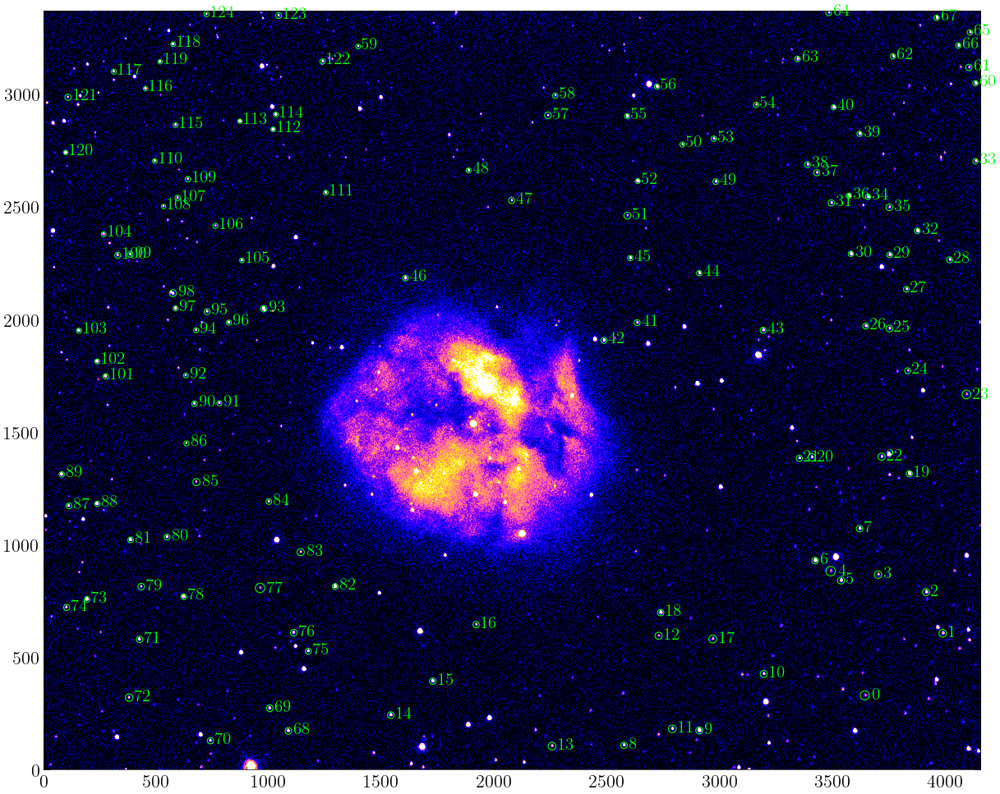

In [12]:
ourfluxes_Ha = Aperture_Photometry(final_Ha, stars_x, stars_y, stars_ra, stars_dec, stars_mag)

## Filter Hb

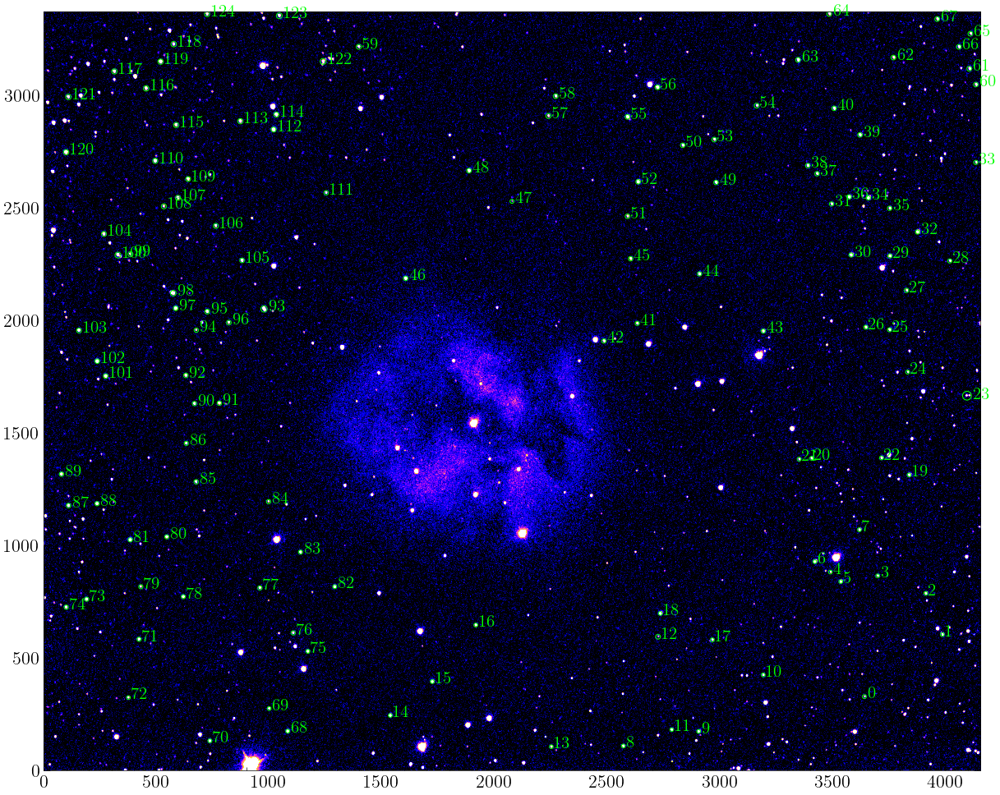

In [13]:
final_Hb = Open_Fits(filepath='Data/final_Hb.fits', plot=False)

ourfluxes_Hb = Aperture_Photometry(final_Hb, stars_x, stars_y, stars_ra, stars_dec, stars_mag)

## Filter g

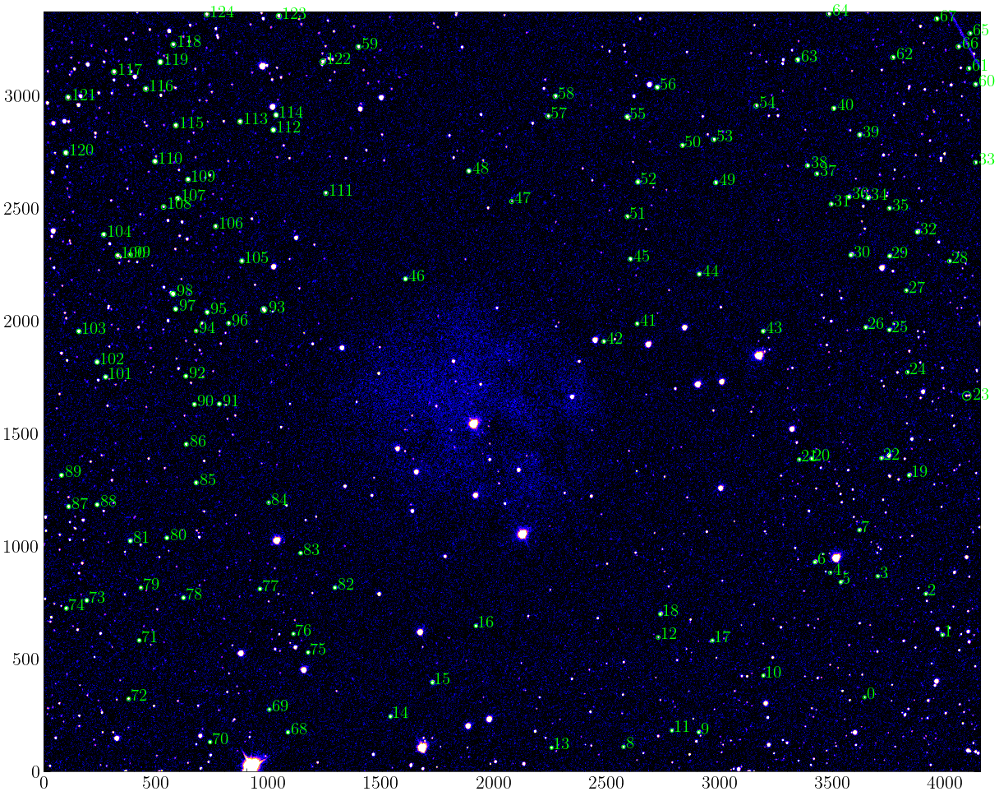

In [14]:
final_g = Open_Fits(filepath='Data/final_g.fits', plot=False)

ourfluxes_g = Aperture_Photometry(final_g, stars_x, stars_y, stars_ra, stars_dec, stars_mag)

## Filter r

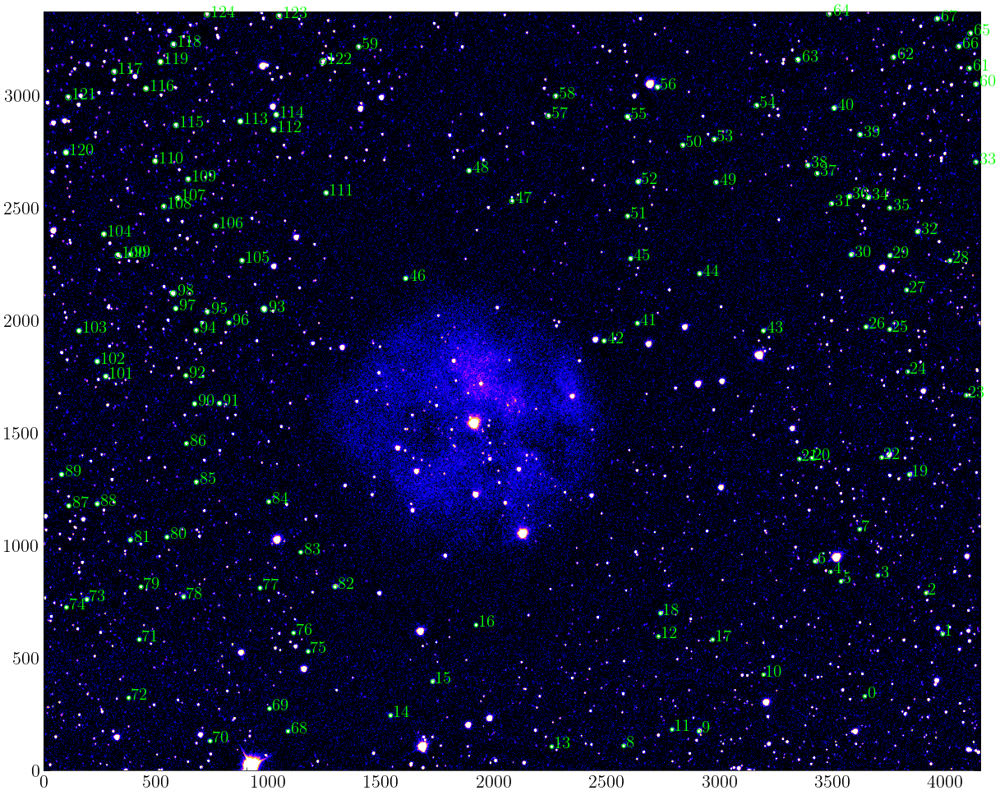

In [15]:
final_r = Open_Fits(filepath='Data/final_r.fits', plot=False)

ourfluxes_r = Aperture_Photometry(final_r, stars_x, stars_y, stars_ra, stars_dec, stars_mag)

## Filter i

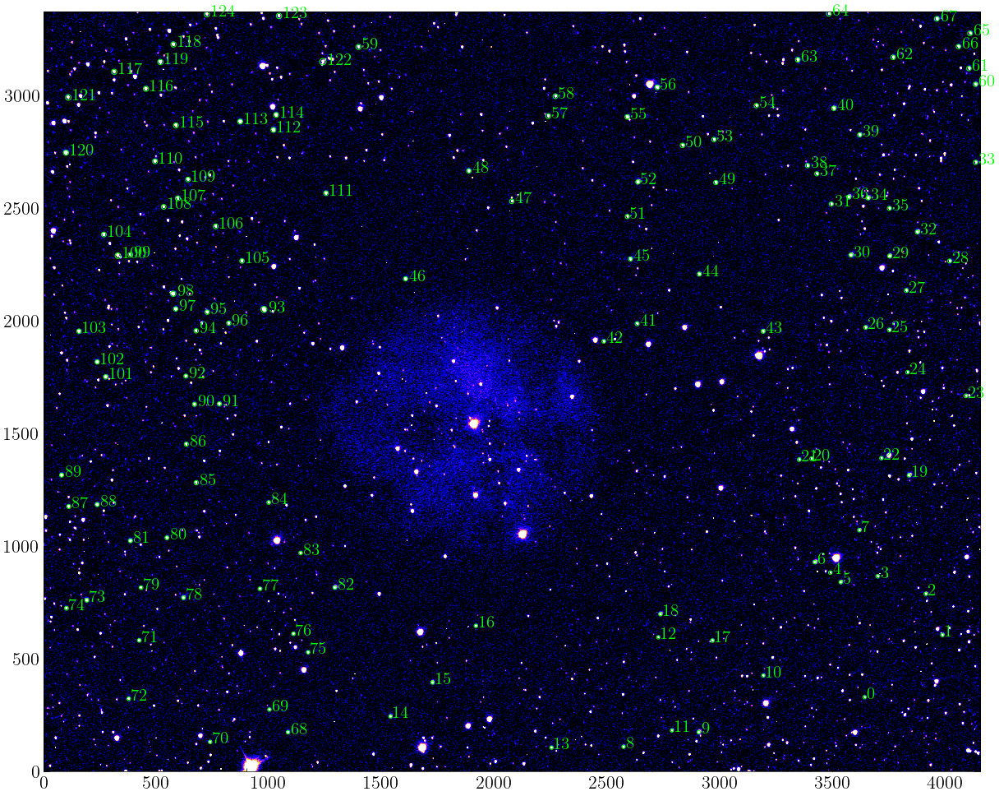

In [16]:
final_i = Open_Fits(filepath='Data/final_i.fits', plot=False)

ourfluxes_i = Aperture_Photometry(final_i, stars_x, stars_y, stars_ra, stars_dec, stars_mag)

# 2) Download Gaia spectra

In [17]:
# https://www.cosmos.esa.int/web/gaia-users/archive/datalink-products
#!pip install astroquery
from astroquery.gaia import Gaia

retrieval_type = 'XP_SAMPLED'     # Options are: 'EPOCH_PHOTOMETRY', 'MCMC_GSPPHOT', 'MCMC_MSC', 'XP_SAMPLED', 'XP_CONTINUOUS', 'RVS', 'ALL'
data_structure = 'INDIVIDUAL'     # Options are: 'INDIVIDUAL' or 'RAW'
data_release   = 'Gaia DR3'       # Options are: 'Gaia DR3' (default), 'Gaia DR2'
datalink = Gaia.load_data(ids=stars_Gaianame,
                          data_release=data_release, retrieval_type=retrieval_type, data_structure=data_structure, format='votable', verbose=True, output_file='Spectra/Gaia_spectra', overwrite_output_file='True')

dl_keys  = [inp for inp in datalink.keys()]

print()
print(f'The following Datalink products have been downloaded:')
for dl_key in dl_keys:
    print(f' * {dl_key}')

"Important:  Gaia archive will be intermittently unavailable due to scheduled maintenance on 10-12-2024 from 08:00 to 10:00 (CET)"
Retrieving data.
Data request: VALID_DATA=false&ID=1974536554930468352%2C1974537207765484288%2C1974537310844693120%2C1974537688801813120%2C1974537753221355392%2C1974537757521454720%2C1974537856298735104%2C1974537998039452416%2C1974539131911015552%2C1974539436846701056%2C1974539647307075712%2C1974539819105777792%2C1974540162703148416%2C1974540437581209984%2C1974541056056499584%2C1974541223553094400%2C1974541708891518208%2C1974542705323786880%2C1974543117641518336%2C1974725529185888128%2C1974725877086574080%2C1974725877086574464%2C1974725911446206336%2C1974726495561744256%2C1974726633000694784%2C1974727079677285120%2C1974727114037143296%2C1974729725377131008%2C1974729862816077184%2C1974730309492805248%2C1974730343852543872%2C1974730515651232256%2C1974730756169270016%2C1974730927967950080%2C1974731134126520832%2C1974731134126521984%2C1974731164182972800%2C1974

ERROR: Path d:\OneDrive - Università degli Studi di Milano-Bicocca\Documenti\PythonProjects\Laboratory-of-Data-Acquisition\Spectra already exist [astroquery.gaia.core]


host = gea.esac.esa.int:443
context = /data-server/data
Content-type = application/x-www-form-urlencoded
200 200
Reading...
Done.
INFO: output_file = d:\OneDrive - Università degli Studi di Milano-Bicocca\Documenti\PythonProjects\Laboratory-of-Data-Acquisition\Spectra\Gaia_spectra.zip [astroquery.gaia.core]

The following Datalink products have been downloaded:
 * XP_SAMPLED-Gaia DR3 1974536554930468352.xml
 * XP_SAMPLED-Gaia DR3 1974537207765484288.xml
 * XP_SAMPLED-Gaia DR3 1974537310844693120.xml
 * XP_SAMPLED-Gaia DR3 1974537688801813120.xml
 * XP_SAMPLED-Gaia DR3 1974537753221355392.xml
 * XP_SAMPLED-Gaia DR3 1974537757521454720.xml
 * XP_SAMPLED-Gaia DR3 1974537856298735104.xml
 * XP_SAMPLED-Gaia DR3 1974537998039452416.xml
 * XP_SAMPLED-Gaia DR3 1974539131911015552.xml
 * XP_SAMPLED-Gaia DR3 1974539436846701056.xml
 * XP_SAMPLED-Gaia DR3 1974539647307075712.xml
 * XP_SAMPLED-Gaia DR3 1974539819105777792.xml
 * XP_SAMPLED-Gaia DR3 1974540162703148416.xml
 * XP_SAMPLED-Gaia DR3 19

In [19]:
wavelengths = datalink[dl_keys[1]][0].to_table().as_array()['wavelength']
wavelengths = np.ma.getdata(wavelengths)
wavelengths

array([ 336.,  338.,  340.,  342.,  344.,  346.,  348.,  350.,  352.,
        354.,  356.,  358.,  360.,  362.,  364.,  366.,  368.,  370.,
        372.,  374.,  376.,  378.,  380.,  382.,  384.,  386.,  388.,
        390.,  392.,  394.,  396.,  398.,  400.,  402.,  404.,  406.,
        408.,  410.,  412.,  414.,  416.,  418.,  420.,  422.,  424.,
        426.,  428.,  430.,  432.,  434.,  436.,  438.,  440.,  442.,
        444.,  446.,  448.,  450.,  452.,  454.,  456.,  458.,  460.,
        462.,  464.,  466.,  468.,  470.,  472.,  474.,  476.,  478.,
        480.,  482.,  484.,  486.,  488.,  490.,  492.,  494.,  496.,
        498.,  500.,  502.,  504.,  506.,  508.,  510.,  512.,  514.,
        516.,  518.,  520.,  522.,  524.,  526.,  528.,  530.,  532.,
        534.,  536.,  538.,  540.,  542.,  544.,  546.,  548.,  550.,
        552.,  554.,  556.,  558.,  560.,  562.,  564.,  566.,  568.,
        570.,  572.,  574.,  576.,  578.,  580.,  582.,  584.,  586.,
        588.,  590.,

In [20]:
fluxes = datalink[dl_keys[1]][0].to_table().as_array()['flux']
fluxes = np.ma.getdata(fluxes)
fluxes

array([5.54085775e-17, 4.85130345e-17, 4.03426076e-17, 3.99746115e-17,
       4.50140903e-17, 4.63039031e-17, 4.20403131e-17, 3.84952652e-17,
       4.12816198e-17, 4.58378695e-17, 4.46862191e-17, 4.17842743e-17,
       4.24533443e-17, 4.30204063e-17, 4.14249966e-17, 4.07480750e-17,
       4.40727588e-17, 4.88645730e-17, 5.00039581e-17, 4.67516890e-17,
       4.37188247e-17, 4.62170028e-17, 5.32769926e-17, 5.96842112e-17,
       6.28738594e-17, 6.36807708e-17, 6.28920110e-17, 5.99905659e-17,
       5.57487043e-17, 5.24848613e-17, 5.31350882e-17, 5.86590896e-17,
       6.70181137e-17, 7.49710648e-17, 7.92952077e-17, 7.96540321e-17,
       7.77627266e-17, 7.59766848e-17, 7.59147257e-17, 7.81118431e-17,
       8.12761796e-17, 8.40866150e-17, 8.55317393e-17, 8.52419150e-17,
       8.35198110e-17, 8.11772885e-17, 7.87096962e-17, 7.69546969e-17,
       7.63025940e-17, 7.68538139e-17, 7.86454474e-17, 8.14056896e-17,
       8.42677742e-17, 8.67293181e-17, 8.84735575e-17, 8.95498849e-17,
      

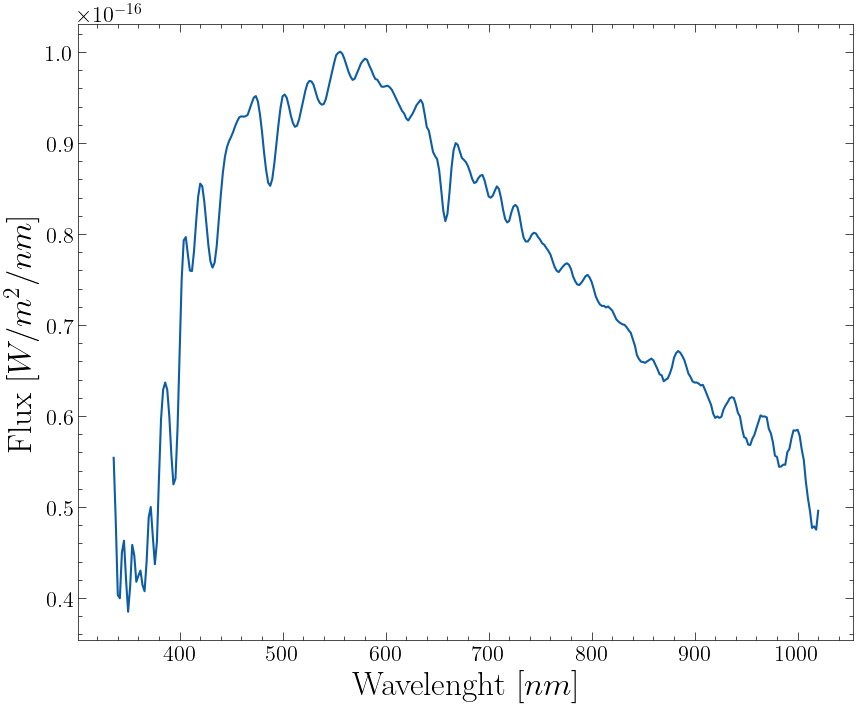

In [21]:
plt.plot(wavelengths, fluxes)
plt.xlabel('Wavelenght $[nm]$')
plt.ylabel('Flux $[W / m^2 / nm]$');

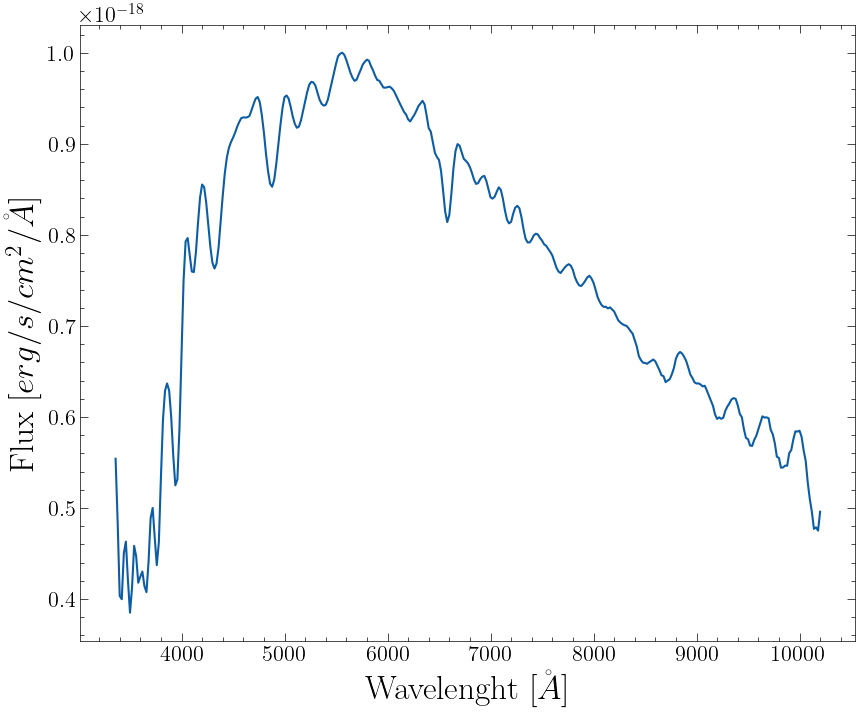

In [22]:
plt.plot(10*wavelengths, (10**(-2))*fluxes) 
plt.xlabel('Wavelenght $[\AA]$')
plt.ylabel('Flux $[erg / s / cm^2 / \AA]$');

# 3) Convolve Gaia spectra with TOBi filters

$$\lambda_\text{pivotal} = \sqrt{\frac{\int \lambda T(\lambda) \, d\lambda}{\int \frac{T(\lambda)}{\lambda} \, d\lambda}}$$

$$f_{\lambda,V}\approx \frac{\int T(\lambda)f(\lambda) d\lambda}{\int T(\lambda) d\lambda}$$

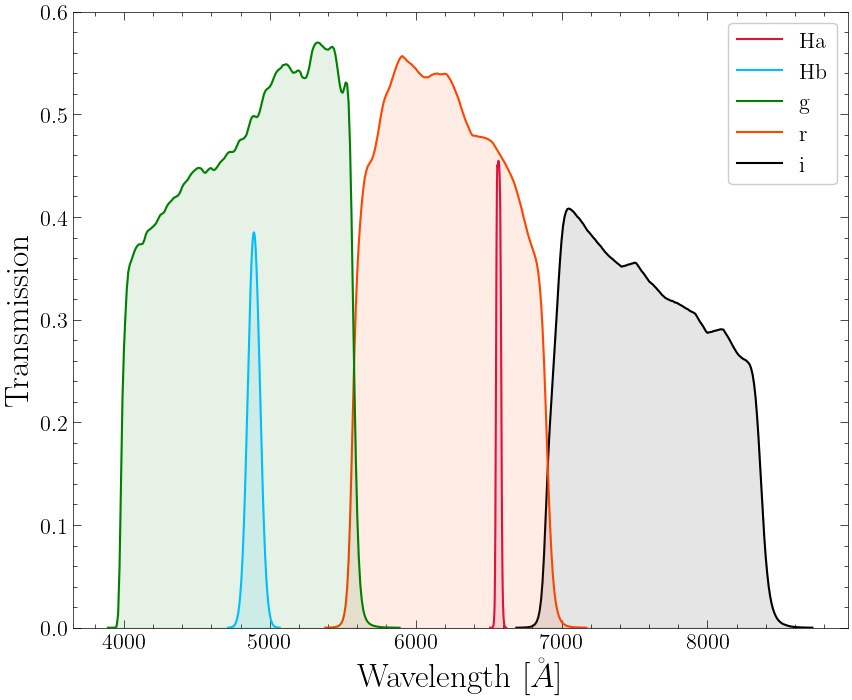

In [23]:
filter_names = ['Ha', 'Hb', 'g', 'r', 'i']

# Corresponding file paths
file_paths = ['Filters/tobi_ha.dat',
              'Filters/tobi_hb.dat',
              'Filters/tobi_gsdss.dat',
              'Filters/tobi_rsdss.dat',
              'Filters/tobi_isdss.dat']

filter_transmission = {}

for filter_name, file_path in zip(filter_names, file_paths):
    data = np.loadtxt(file_path)
    x = data[:, 0]  
    y = data[:, 1]  
    # Store the data in a dictionary with the filter name as key
    filter_transmission[filter_name] = {'wavelength': x, 'transmission': y}


# Plot the filters
plot_colors = ['crimson', 'deepskyblue', 'green', 'orangered', 'black']
for i, filter_name in enumerate(filter_names):
    
    plt.plot(filter_transmission[filter_name]['wavelength'], filter_transmission[filter_name]['transmission'], 
             color=plot_colors[i], zorder=4-i, label=filter_name) 
    
    plt.fill_between(filter_transmission[filter_name]['wavelength'], filter_transmission[filter_name]['transmission'], 
                     color=plot_colors[i], alpha=0.1, zorder=4-i)
    
    plt.ylim(0, 0.6) 
    plt.xlabel('Wavelength $[\AA]$')
    plt.ylabel('Transmission')
    plt.legend();

In [24]:
# https://www.youtube.com/watch?v=IaSGqQa5O-M

# gives flux in filter, given the transmission and the spectra
from scipy.integrate import quad
from scipy.interpolate import interp1d

def convolution_function_flux(spectra_wavelength, flux, transmission_wavelength, transmission):

    spectra = interp1d(spectra_wavelength, flux, kind='linear', fill_value="extrapolate")
    transmission = interp1d(transmission_wavelength, transmission, kind='linear', fill_value="extrapolate")

    flux_per_transmission, error = quad(lambda w: spectra(w)*transmission(w), 4000, 9000)
    norm, error = quad(lambda w: transmission(w), 4000, 9000)

    return flux_per_transmission/norm

In [25]:
truefluxes_Ha = []

for i in range(len(stars_Gaianame)):
    wavelengths = datalink[dl_keys[i]][0].to_table().as_array()['wavelength']
    wavelengths = np.ma.getdata(wavelengths)
    wavelengths = 10*wavelengths # Convert from nm to Angstrom
    
    fluxes = datalink[dl_keys[i]][0].to_table().as_array()['flux']
    fluxes = np.ma.getdata(fluxes)
    fluxes = (10**(-2))*fluxes # Convert from W/m^2/nm to erg/s/cm^2/Angstrom

    truefluxes_Ha.append(convolution_function_flux(wavelengths, 
                                                   fluxes, 
                                                   filter_transmission['Ha']['wavelength'], 
                                                   filter_transmission['Ha']['transmission']))

C:\Users\marco\AppData\Local\Temp\ipykernel_13236\2207840108.py:13: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  norm, error = quad(lambda w: transmission(w), 4000, 9000)


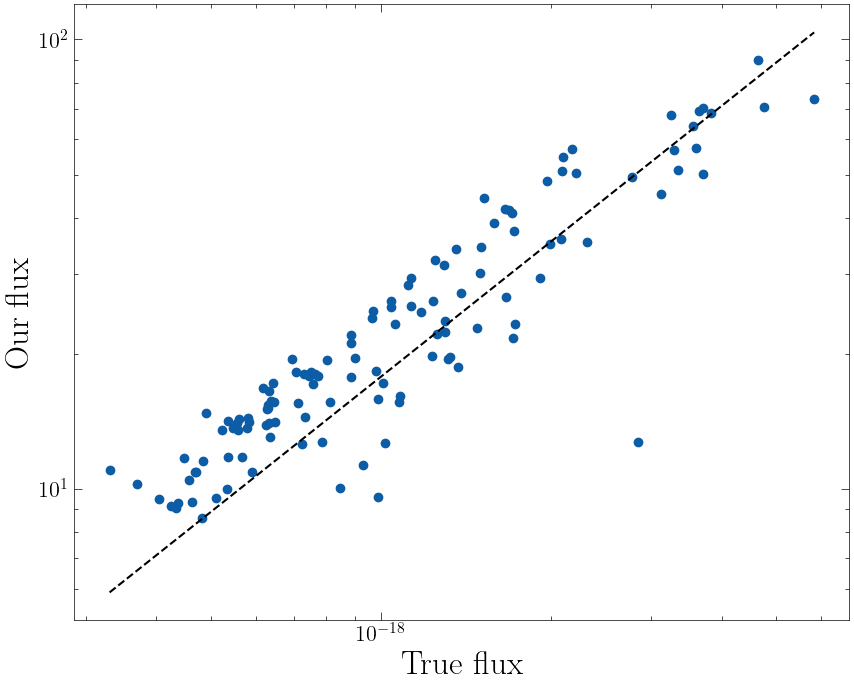

In [38]:
plt.plot(truefluxes_Ha, ourfluxes_Ha, 'o')

x_dense = np.linspace(np.min(truefluxes_Ha), np.max(truefluxes_Ha), 1000)
plt.plot(x_dense, 10**19.25*x_dense, linestyle='--', color='black')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('True flux')
plt.ylabel('Our flux');

In [39]:
truefluxes_Hb = []

for i in range(len(stars_Gaianame)):
    wavelengths = datalink[dl_keys[i]][0].to_table().as_array()['wavelength']
    wavelengths = np.ma.getdata(wavelengths)
    wavelengths = 10*wavelengths # Convert from nm to Angstrom
    
    fluxes = datalink[dl_keys[i]][0].to_table().as_array()['flux']
    fluxes = np.ma.getdata(fluxes)
    fluxes = (10**(-2))*fluxes # Convert from W/m^2/nm to erg/s/cm^2/Angstrom

    truefluxes_Hb.append(convolution_function_flux(wavelengths, 
                                                   fluxes, 
                                                   filter_transmission['Hb']['wavelength'], 
                                                   filter_transmission['Hb']['transmission']))

C:\Users\marco\AppData\Local\Temp\ipykernel_13236\2207840108.py:13: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  norm, error = quad(lambda w: transmission(w), 4000, 9000)


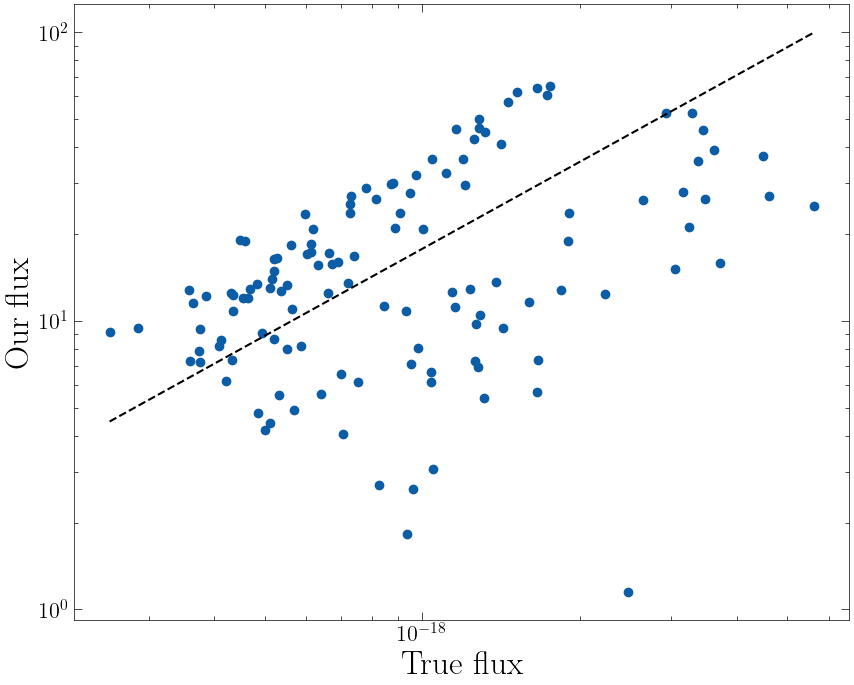

In [40]:
plt.plot(truefluxes_Hb, ourfluxes_Hb, 'o')

x_dense = np.linspace(np.min(truefluxes_Hb), np.max(truefluxes_Hb), 1000)
plt.plot(x_dense, 10**19.25*x_dense, linestyle='--', color='black')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('True flux')
plt.ylabel('Our flux');

In [41]:
truefluxes_g = []

for i in range(len(stars_Gaianame)):
    wavelengths = datalink[dl_keys[i]][0].to_table().as_array()['wavelength']
    wavelengths = np.ma.getdata(wavelengths)
    wavelengths = 10*wavelengths # Convert from nm to Angstrom
    
    fluxes = datalink[dl_keys[i]][0].to_table().as_array()['flux']
    fluxes = np.ma.getdata(fluxes)
    fluxes = (10**(-2))*fluxes # Convert from W/m^2/nm to erg/s/cm^2/Angstrom

    truefluxes_g.append(convolution_function_flux(wavelengths, 
                                                   fluxes, 
                                                   filter_transmission['g']['wavelength'], 
                                                   filter_transmission['g']['transmission']))

C:\Users\marco\AppData\Local\Temp\ipykernel_13236\2207840108.py:13: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  norm, error = quad(lambda w: transmission(w), 4000, 9000)


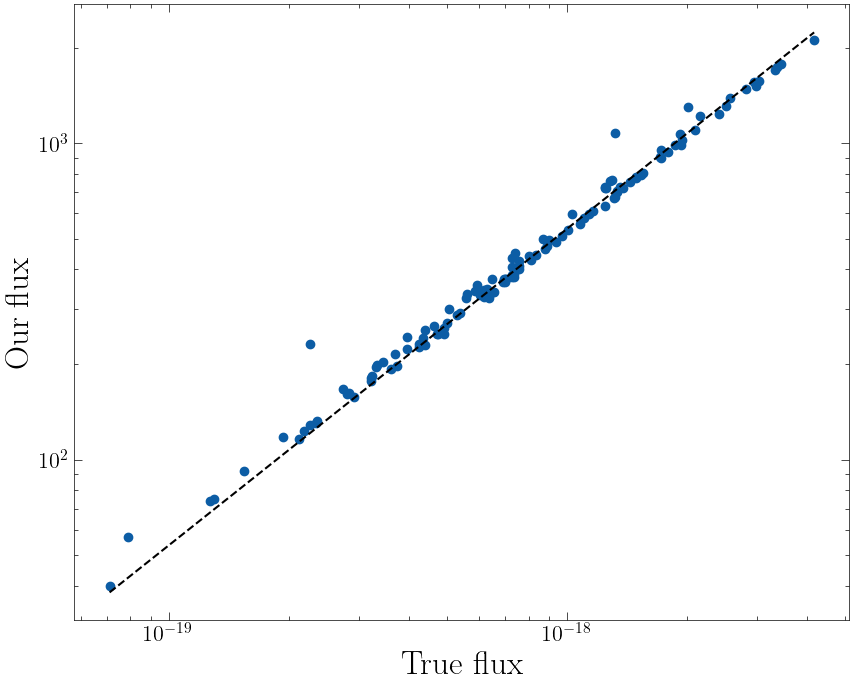

In [48]:
plt.plot(truefluxes_g, ourfluxes_g, 'o')

x_dense = np.linspace(np.min(truefluxes_g), np.max(truefluxes_g), 1000)
plt.plot(x_dense, 10**20.73*x_dense, linestyle='--', color='black')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('True flux')
plt.ylabel('Our flux');

In [49]:
truefluxes_r = []

for i in range(len(stars_Gaianame)):
    wavelengths = datalink[dl_keys[i]][0].to_table().as_array()['wavelength']
    wavelengths = np.ma.getdata(wavelengths)
    wavelengths = 10*wavelengths # Convert from nm to Angstrom
    
    fluxes = datalink[dl_keys[i]][0].to_table().as_array()['flux']
    fluxes = np.ma.getdata(fluxes)
    fluxes = (10**(-2))*fluxes # Convert from W/m^2/nm to erg/s/cm^2/Angstrom

    truefluxes_r.append(convolution_function_flux(wavelengths, 
                                                   fluxes, 
                                                   filter_transmission['r']['wavelength'], 
                                                   filter_transmission['r']['transmission']))

C:\Users\marco\AppData\Local\Temp\ipykernel_13236\2207840108.py:13: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  norm, error = quad(lambda w: transmission(w), 4000, 9000)


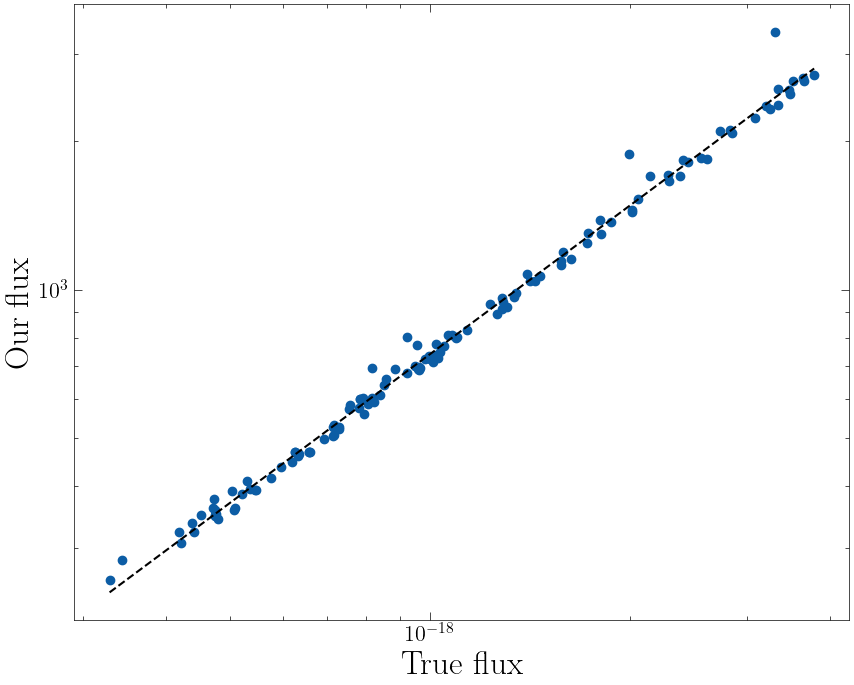

In [56]:
plt.plot(truefluxes_r, ourfluxes_r, 'o')

x_dense = np.linspace(np.min(truefluxes_r), np.max(truefluxes_r), 1000)
plt.plot(x_dense, 10**20.87*x_dense, linestyle='--', color='black')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('True flux')
plt.ylabel('Our flux');

In [57]:
truefluxes_i = []

for i in range(len(stars_Gaianame)):
    wavelengths = datalink[dl_keys[i]][0].to_table().as_array()['wavelength']
    wavelengths = np.ma.getdata(wavelengths)
    wavelengths = 10*wavelengths # Convert from nm to Angstrom
    
    fluxes = datalink[dl_keys[i]][0].to_table().as_array()['flux']
    fluxes = np.ma.getdata(fluxes)
    fluxes = (10**(-2))*fluxes # Convert from W/m^2/nm to erg/s/cm^2/Angstrom

    truefluxes_i.append(convolution_function_flux(wavelengths, 
                                                   fluxes, 
                                                   filter_transmission['i']['wavelength'], 
                                                   filter_transmission['i']['transmission']))

C:\Users\marco\AppData\Local\Temp\ipykernel_13236\2207840108.py:13: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  norm, error = quad(lambda w: transmission(w), 4000, 9000)


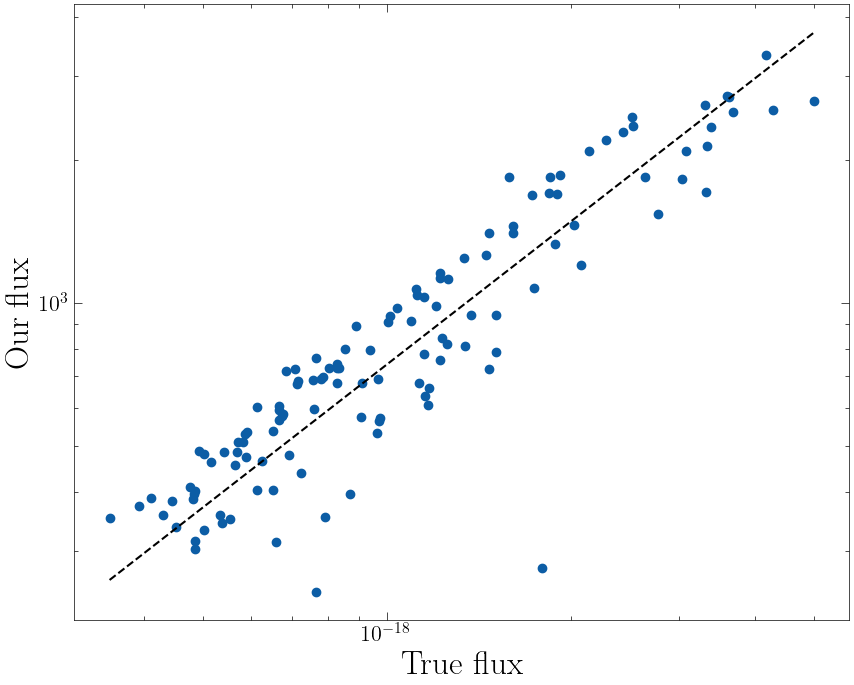

In [58]:
plt.plot(truefluxes_i, ourfluxes_i, 'o')

x_dense = np.linspace(np.min(truefluxes_i), np.max(truefluxes_i), 1000)
plt.plot(x_dense, 10**20.87*x_dense, linestyle='--', color='black')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('True flux')
plt.ylabel('Our flux');

In [59]:
print(19.25 - 16.58)
print(19.25 - 16.06)
print(20.73 - 17.61)
print(20.87 - 18.12)
print(20.87 - 18.08)

2.6700000000000017
3.1900000000000013
3.120000000000001
2.75
2.7900000000000027


# Science?

$ \mathrm{flux}_{\mathrm{H}\alpha}/\mathrm{flux}_{\mathrm{H}\beta} \approx 2.86^{+0.18}_{-0.11} $

$D = \frac{f_{\mathrm{H}\alpha}}{f_{\mathrm{H}\beta}} - 2.9 = (R_\alpha / R_\beta) 10^{-0.4(ZP_{\alpha} - ZP_{\beta})} - 2.9$  Minimo X>0.2 perché abbia qualche senso

Area nebulosa divisa in 3000 sezioni da 180 pixel, per noi sarebbero circa 450 pixel per sezione (Binning 0.0167 × 0.0167 × 0.0167 dex^3 ?)

https://www.aanda.org/articles/aa/full_html/2023/02/aa45072-22/aa45072-22.html